# Providing predictive services/recommendation engine with Machine learning and geo-spatial data

Related medium post: 

## Getting data - Gowalla dataset

https://snap.stanford.edu/data/loc-gowalla.html

import numpy as np
np.random.seed(1337)

import os
datadir = './data'
if not os.path.exists(datadir):
    os.mkdir(datadir)

url = 'https://snap.stanford.edu/data/loc-gowalla_totalCheckins.txt.gz' 
filename = os.path.join(datadir, 'loc-gowalla_totalCheckins.txt.gz')

if not os.path.isfile(filename):
    import wget
    wget.download(url, out=filename)

### Fetch and extract the required 'text' using regex from raw data and create a new file containing venues

In [3]:
## Fetch The venue names [2] in New York City 
from __future__ import unicode_literals
url = 'https://storage.googleapis.com/google-code-archive-downloads/v2/code.google.com/locrec/gowalla-dataset.zip' 

src_filename = os.path.join(datadir, 'gowalla-dataset.zip')
trg_filename = os.path.join(datadir, 'gowalla_venues.csv') # data/gowalla_venues.csv
import sys  
reload(sys)  
sys.setdefaultencoding('utf8')

if not os.path.isfile(trg_filename):
    import shutil
    import zipfile
    import re

    wget.download(url, out=src_filename)

    #extract
    zf = zipfile.ZipFile(src_filename, 'r')
    extracted_file = zf.extract('gowalla-dataset/spots.txt', datadir)
    #tmp_filename = shutil.copy(extracted_file, datadir) # extracfile -> ./data/
    tmp_filename = "data/spots.txt"
    shutil.rmtree(os.path.dirname(extracted_file))

    #preprocess
    regex = re.compile(r'POINT\((\-?\d+\.\d+)\s+(\-?\d+\.\d+)\)')

    with open(tmp_filename, "r") as src, \
         open(trg_filename, "w") as dst  :

        next(src) 
        for line in src: 
            dst.write(regex.sub(r'\2\t\1', line))

    #cleanup
    os.remove(src_filename)
    os.remove(tmp_filename)

In [36]:
# The desired output looks something like:
!head -n 5 data/venues.csv

1391604,Conference House Park,40.5017589436,-74.2523431778
1391611,Almer G. Russell Pavilion,40.5022647413,-74.2542636395
3612422,Conference House,40.5000644614,-74.2490418254
3612431,Billop House,40.5000644614,-74.2490418254
1391499,Biddle House,40.5054829933,-74.2541456223


## Data preparation

In [21]:
import pandas as pd
import os
datadir = './data'
filename = os.path.join(datadir, 'loc-gowalla_totalCheckins.txt.gz')

df = pd.read_csv(filename, sep='\t', header=None)
df.columns = ['uid','timestamp','lat','lon','venue_id']
df.head()

,uid,timestamp,lat,lon,venue_id
0,0,2010-10-19T23:55:27Z,30.235909,-97.795140,22847
1,0,2010-10-18T22:17:43Z,30.269103,-97.749395,420315
2,0,2010-10-17T23:42:03Z,30.255731,-97.763386,316637
3,0,2010-10-17T19:26:05Z,30.263418,-97.757597,16516
4,0,2010-10-16T18:50:42Z,30.274292,-97.740523,5535878


In [22]:
df.shape

(6442892, 5)

### Filtering new york city venues

The Flickr API provides us with the bounding box of the city.
https://www.flickr.com/places/info/2459115

Bounding Box: -74.2589, 40.4774, -73.7004, 40.9176 Centroid: -74.0071, 40.7146

In [23]:
lon_min, lat_min, lon_max, lat_max = -74.2589, 40.4774, -73.7004, 40.9176

df = df[ (df['lon']>lon_min) & (df['lon']<lon_max) & (df['lat']>lat_min) & (df['lat']<lat_max) ]

df.head()

,uid,timestamp,lat,lon,venue_id
10,0,2010-10-12T00:21:28Z,40.643885,-73.782806,23261
11,0,2010-10-11T20:21:20Z,40.741374,-73.988105,16907
12,0,2010-10-11T20:20:42Z,40.741388,-73.989455,12973
13,0,2010-10-11T00:06:30Z,40.724910,-73.994621,341255
14,0,2010-10-10T22:00:37Z,40.729768,-73.998535,260957


In [24]:
df.shape

(138957, 5)

### Parse and localize date and time: UTC -> local

In [65]:
import pytz as tz # better alternatives -> Apache arrow or pendulum
from datetime import datetime

def parse_datetime(s):
    tzone = tz.timezone("America/New_York")
    utc = datetime.strptime(s, '%Y-%m-%dT%H:%M:%SZ')
    return tz.utc.localize(utc).astimezone(tzone)


In [26]:
df['ts'] = df['timestamp'].apply(lambda x: parse_datetime(x))
df = df.drop('timestamp',axis=1,errors='ignore')

In [27]:
df['date'] = df['ts'].astype(object).apply(lambda x: x.date())
df['time'] = df['ts'].astype(object).apply(lambda x: x.time())
#day of the week (localtime) & hour of the day (localtime)
df['wd'] = df['date'].astype(object).apply(lambda x : x.weekday())
df['d'] = df['date'].astype(object).apply(lambda x : x.day)
df['h'] = df['time'].astype(object).apply(lambda x : x.hour)
df[['ts','date','time','wd','d','h']][0:3]

,ts,date,time,wd,d,h
10,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
11,2010-10-11 16:21:20-04:00,2010-10-11,16:21:20,0,11,16
12,2010-10-11 16:20:42-04:00,2010-10-11,16:20:42,0,11,16


### Loading the venues data

In [31]:
filename = os.path.join(datadir, 'venues.csv')

dfv = pd.read_csv(filename, sep=',', header=None)
dfv.columns = ['venue_id','name','lat','lon']
dfv.head()

,venue_id,name,lat,lon
0,1391604,Conference House Park,40.501759,-74.252343
1,1391611,Almer G. Russell Pavilion,40.502265,-74.254264
2,3612422,Conference House,40.500064,-74.249042
3,3612431,Billop House,40.500064,-74.249042
4,1391499,Biddle House,40.505483,-74.254146


### Joining Events with venues on venue ID

In [39]:
# Will ignore events not in our venue id
df_merged = pd.DataFrame.merge(df, dfv[['venue_id']], on="venue_id", how="inner")
df_merged.head()

,uid,lat,lon,venue_id,ts,date,time,wd,d,h
0,0,40.643885,-73.782806,23261,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
1,0,40.643885,-73.782806,23261,2010-10-07 11:27:40-04:00,2010-10-07,11:27:40,3,7,11
2,5,40.643885,-73.782806,23261,2010-08-15 23:47:20-04:00,2010-08-15,23:47:20,6,15,23
3,8,40.643885,-73.782806,23261,2010-10-06 16:23:14-04:00,2010-10-06,16:23:14,2,6,16
4,15,40.643885,-73.782806,23261,2010-10-13 00:10:36-04:00,2010-10-13,00:10:36,2,13,0


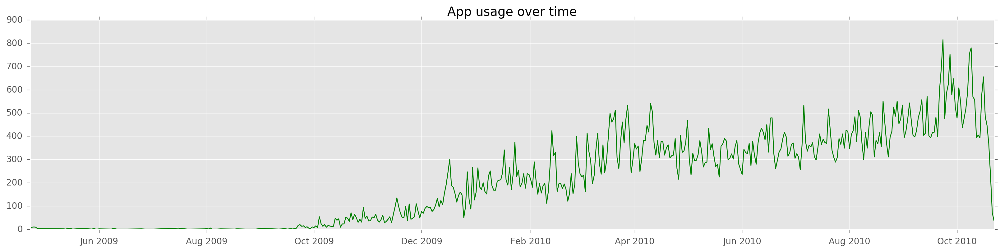

In [58]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
#import seaborn as sns
#import matplotlib as mpl
#mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.rcParams.update({'font.size': 14})
plt.rcParams['xtick.major.pad']='5'
plt.rcParams['ytick.major.pad']='5'

plt.style.use('ggplot')

plt.subplot(4, 1, 1)
top = df_merged.groupby('date').size()
plt.plot(top.index, top, 'g-')
plt.title('App usage over time')
plt.show()

- ### What is the distribution of events per hour of the day, per day of the week?


- ### What is the histogram of the number of events registered per user?


- ### Which are the most popular venues of all time?

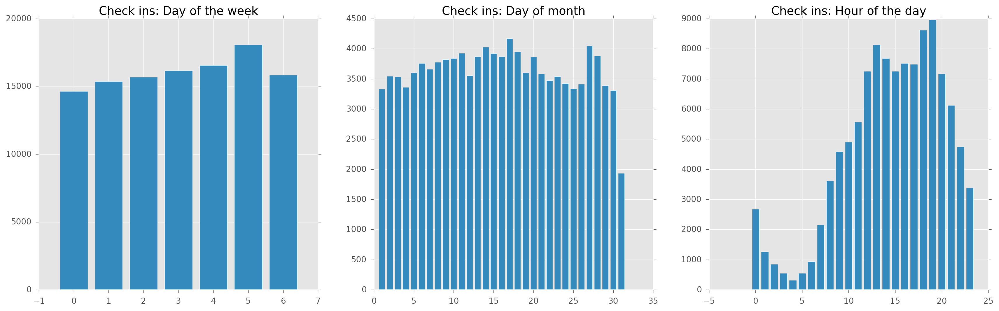

In [64]:
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,6)

plt.subplot(1,3,1)
events_per_hour = df_merged.groupby('wd').size()
plt.bar(events_per_hour.index, events_per_hour, align='center')
plt.title('Check ins: Day of the week')

plt.subplot(1,3,2)
day_month = df_merged.groupby('d').size()
plt.bar(day_month.index, day_month, align='center')
plt.title('Check ins: Day of month')

plt.subplot(1,3,3)
popular_venues = df_merged.groupby('h').size()
plt.bar(popular_venues.index, popular_venues, align='center')
plt.title('Check ins: Hour of the day')

plt.show()

The week seems to build up towards Saturday as the most popular day to record and share memorable events and venues. The end of the month has a surge of activities (most likely connected to people being happy to get their salaries). Finally, as expected, activity peaks during lunch and dinner times.


---

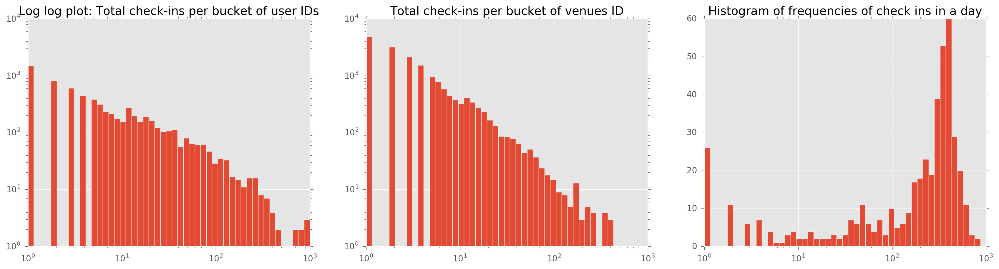

In [78]:
import numpy as np
plt.style.use('ggplot')
fig = plt.figure()
fig.set_size_inches(21,5)
plt.subplot(1,3,1)
events_per_user = df_merged.groupby('uid').size()
plt.hist(events_per_user, bins=np.logspace(0,3,50))
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")
plt.title('Log log plot: Total check-ins per bucket of user IDs')
plt.subplot(1,3,2)
venues = df_merged.groupby('venue_id').size()
plt.hist(venues, bins=np.logspace(0,3,50))
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")
plt.title('Total check-ins per bucket of venues ID')
plt.subplot(1,3,3)
dates = df_merged.groupby('date').size()
plt.hist(dates, bins=np.logspace(0,3,50))
plt.gca().set_xscale("log")
plt.title('Histogram of frequencies of check ins in a day')
plt.show()

### Both venues and users exhibit a [zipf's](https://en.wikipedia.org/wiki/Zipf's_law) law behavior, as shown above. Most of the registered users are related to small number of users and venues. The number of event registered are inversely related to the rank order. This applies to both the users as well as venues. The third histogram above shows that 60 is the most common number of events registered in a day in the city of New York

### Most common venues?

In [80]:
common_venues = df_merged.groupby(['venue_id']).size()
dfv.join(common_venues.rename('count'), on='venue_id', how='inner').sort_values(by='count', ascending=False).head(10)

,venue_id,name,lat,lon,count
23282,12505,LGA LaGuardia Airport,40.774578,-73.872006,1680
4965,23261,JFK John F. Kennedy International,40.643885,-73.782806,1654
12524,11844,Times Square,40.756880,-73.986225,1089
1488,24963,EWR Newark Liberty International,40.691247,-74.179516,1089
17221,13022,Grand Central Terminal,40.752792,-73.977256,1005
8447,11875,Madison Square Garden,40.750614,-73.993435,430
18226,12525,The Museum of Modern Art (MoMA),40.761255,-73.977580,392
12022,12313,Empire State Building,40.748444,-73.985732,390
26247,11720,Yankee Stadium,40.829406,-73.927431,376
13629,11834,Bryant Park,40.753816,-73.983618,364


.. which makes sense. This initial analysis is a global cumulative analysis which does not take into account the fact that each area of the city has a specific dynamic. We could of course divide the city using an uniform grid, but this will not render justice to areas in Manhattan which are highly popular.

In [83]:
num_users = df_merged.groupby(['uid']).size().sort_values(ascending=False).head(10)
num_users

uid
578     1642
22      1290
842     1145
4985    1063
4902     968
4929     925
2798     919
3480     785
2964     779
1201     740
dtype: int64

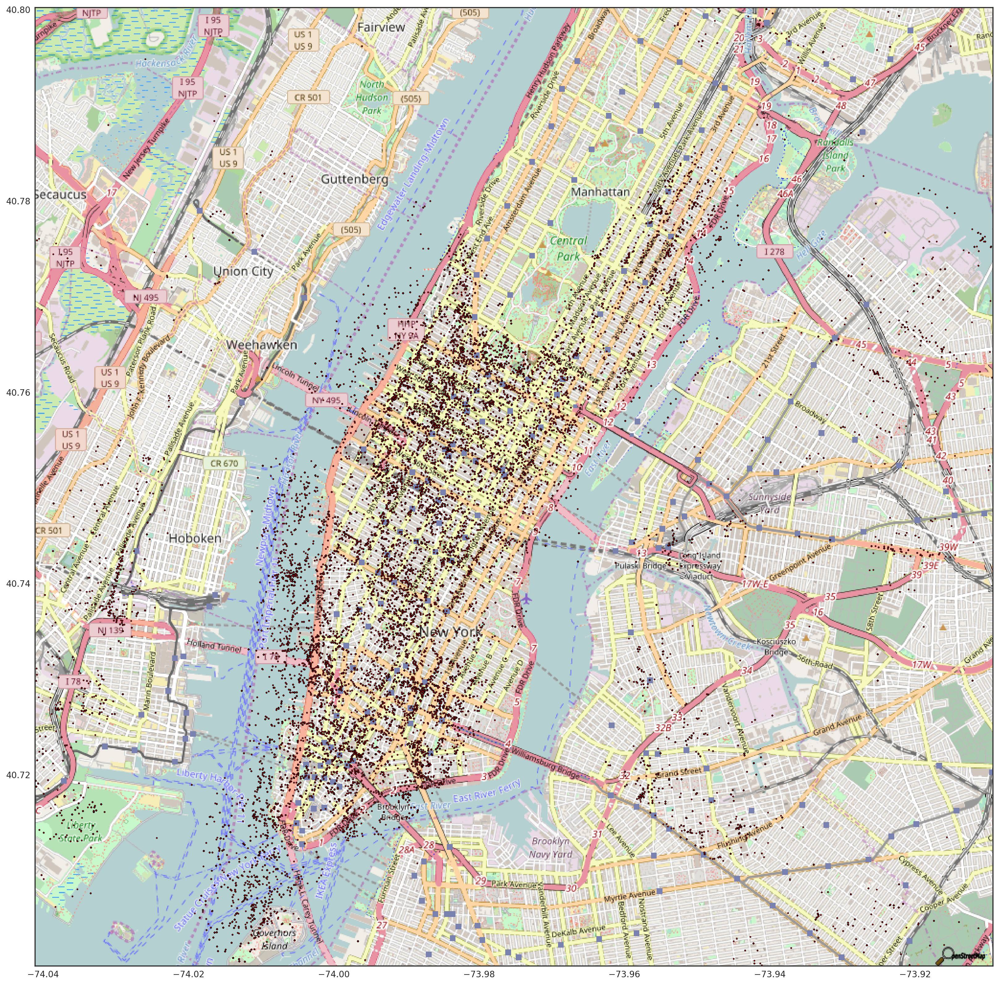

In [99]:
from PIL import Image
import urllib
import wget
def get_map(x,y,z,size, filename) :
    static_map = "http://staticmap.openstreetmap.de/staticmap.php?center={0},{1}&zoom={2}&size={3}x{3}&maptype=mapnik".format(y,x,z,size)

    static_map_filename, headers = urllib.urlretrieve(static_map, filename)
    return static_map_filename

def geomap(data, zoom=13, point_size=3, point_color='r', point_alpha=1):
    #corrections to match geo with static map
    z=zoom
    picsize=1000
    wx = 1.0*360*(picsize/256)/(2**z) 
    wy = 0.76*360*(picsize/256)/(2**z) 

    #center of manhattan
    y = 40.7502
    x = -73.9752

    x_min, x_max = x-wx/2, x+wx/2
    y_min, y_max = y-wy/2, y+wy/2

    static_map_filename = os.path.join(datadir, 'nyc_staticmap_{}_{}.png'.format(z,picsize))

    if os.path.isfile(static_map_filename)==False:
        get_map(x,y,z,picsize,static_map_filename)

    img = Image.open(static_map_filename)

    #add the static map
    plt.imshow(img,zorder=0, extent=[x_min, x_max, y_min, y_max], interpolation='none', aspect='auto')

    #add the scatter plot of events
    plt.plot( 
        data['lon'], 
        data['lat'], 
        '.', 
        markerfacecolor=point_color, 
        markeredgecolor='k', 
        markersize=point_size, 
        alpha=point_alpha)

    #limit the plot to the given box
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

plt.style.use('seaborn-white')

fig = plt.figure()
fig.set_size_inches(20,20)

geomap(df_merged[['lon','lat']])

plt.show()

In [98]:
!ls

README.md                       data
Recommendation_Spatial_ML.ipynb


## Let's initialize k-means++ for our unsupervised learning

To note here, is how we are initializing with lots of clusters - assuming non-normal distribution, can we expect equal number of points in each cluster? Probably not

In [103]:
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import pairwise_distances

ml = KMeans(n_clusters=200, init='k-means++')
ml.fit(df_merged[['lon', 'lat']].sample(frac=0.3))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=200, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [104]:
cluster = ml.cluster_centers_
cluster[:10]

array([[-73.88027122,  40.73876914],
       [-74.00008046,  40.72459124],
       [-74.15969275,  40.71060809],
       [-73.98303194,  40.74363886],
       [-73.79005608,  40.64467657],
       [-73.9628088 ,  40.77187044],
       [-74.13766051,  40.82759275],
       [-74.01217851,  40.6749301 ],
       [-73.93567581,  40.85609475],
       [-74.16653137,  40.58072714]])

In [106]:
df_merged['cluster'] = ml.predict(df_merged[['lon','lat']])
df_merged[['uid','lat','lon','venue_id','cluster']].sample(10)

,uid,lat,lon,venue_id,cluster
22031,3480,40.767391,-73.981435,110749,167
89902,30154,40.729958,-73.993199,213119,86
110124,83721,40.904360,-73.967239,738692,152
40724,3440,40.753637,-73.980528,212299,129
63337,5316,40.739754,-74.006440,194358,143
109095,104357,40.679935,-73.932742,1412805,104
106600,131377,40.705610,-74.008674,1124411,32
29199,2197,40.767972,-73.981869,154608,167
99901,52151,40.679280,-73.983526,192673,169
78415,5001,40.690694,-73.995698,197431,44


I like to think of this like a uniform grid, but each grid cell is not the same size or shape. Can be any polygon. Also known as 'Voronoi'.

In [111]:
from scipy.spatial import Voronoi
def voronoi_polygons_2d(vor, radius=None):
    """
    Reconstruct infinite voronoi regions in a 2D diagram to finite
    regions.

    Input_args:
    vor : Voronoi
        Input diagram
    radius : float, optional
        Distance to 'points at infinity'.

    :returns:
    regions : list of tuples
        Indices of vertices in each revised Voronoi regions.
    vertices : list of tuples
        Coordinates for revised Voronoi vertices. Same as coordinates
        of input vertices, with 'points at infinity' appended to the
        end.

    """
    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max()*2

    # Construct a map containing all ridges for a given point
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region in enumerate(vor.point_region):
        vertices = vor.regions[region]

        if all([v >= 0 for v in vertices]):
            # finite region
            new_regions.append(vertices)
            continue

        # reconstruct a non-finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                # finite ridge: already in the region
                continue

            # Compute the missing endpoint of an infinite ridge

            t = vor.points[p2] - vor.points[p1] # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v2] + direction * radius

            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())

        # sort region counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:,1] - c[1], vs[:,0] - c[0])
        new_region = np.array(new_region)[np.argsort(angles)]

        # finish
        new_regions.append(new_region.tolist())

    return new_regions, np.asarray(new_vertices)

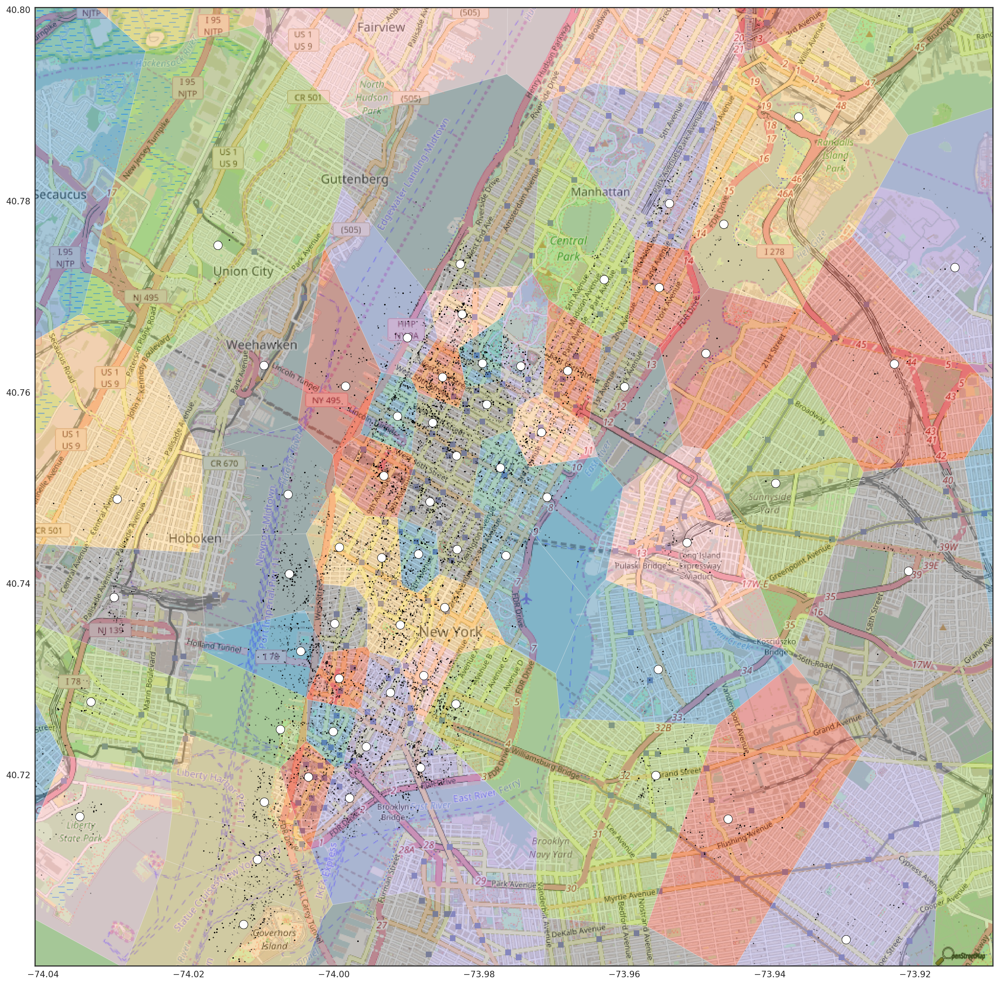

In [115]:
#points = np.array([[c[1], c[0]] for c in clusters])
points = cluster

# compute Voronoi tesselation
vor = Voronoi(points)

# compute regions
regions, vertices = voronoi_polygons_2d(vor)

# prepare figure
plt.style.use('seaborn-white')
fig = plt.figure()
fig.set_size_inches(20,20)

#geomap
geomap(df_merged[['lon','lat']], 13, 2,'k',0.1)

# centroids
plt.plot(points[:,0], points[:,1], 'wo',markersize=10)

# colorize
for region in regions:
    polygon = vertices[region]
    plt.fill(*zip(*polygon), alpha=0.4)

plt.show()

[[ 0.16389896  0.60355454]
 [ 0.4553082   0.94527144]
 [ 0.90669295  0.26747276]
 [ 0.87841596  0.50240391]
 [ 0.98023282  0.9161874 ]
 [ 0.58436031  0.74826336]
 [ 0.34493743  0.85830491]
 [ 0.48107139  0.73900031]
 [ 0.1020089   0.39886864]
 [ 0.21830018  0.95870405]
 [ 0.22816384  0.3451689 ]
 [ 0.57045955  0.91572174]
 [ 0.84046745  0.47247728]
 [ 0.80911331  0.48222671]
 [ 0.67407177  0.35959205]]


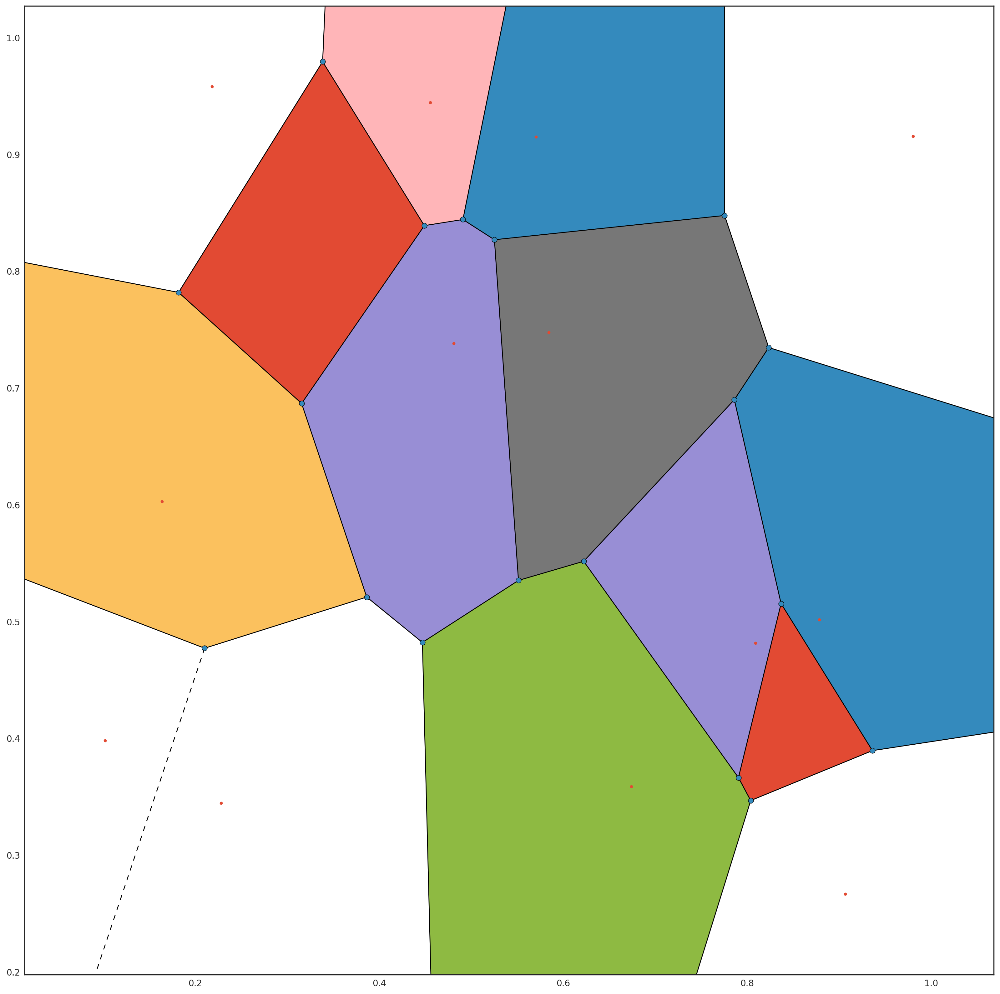

In [110]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d

# make up data points
points = np.random.rand(15,2)
print points
# compute Voronoi tesselation
vor = Voronoi(points)

# plot
voronoi_plot_2d(vor)

# colorize
for region in vor.regions:
    if not -1 in region:
        polygon = [vor.vertices[i] for i in region]
        plt.fill(*zip(*polygon))

plt.show()